# GANs for Dog Image Generation

## Import Libraries / Dependencies / Packages / Modules

In [1]:
import os
import time
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm
import imageio

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchvision import datasets, transforms
from torchvision.utils import save_image


c:\Users\whdqk\anaconda3\envs\sam\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Dataset and Path

In [2]:
dir_curr = "./" # current directory
print(os.listdir(dir_curr)) # Print list of files in the directory

['abstract_art', 'art_portrait', 'GAN_IntrinsicReward.ipynb', 'GAN_No_IntrinsicReward.ipynb', 'generated_images_intrinsic_reward.gif']


In [3]:
path_img = dir_curr + "art_portrait/art_portrait/" # image path
images = os.listdir(path_img) # list of images file names
print(f'# of images: {len(images)}')

# of images: 4117


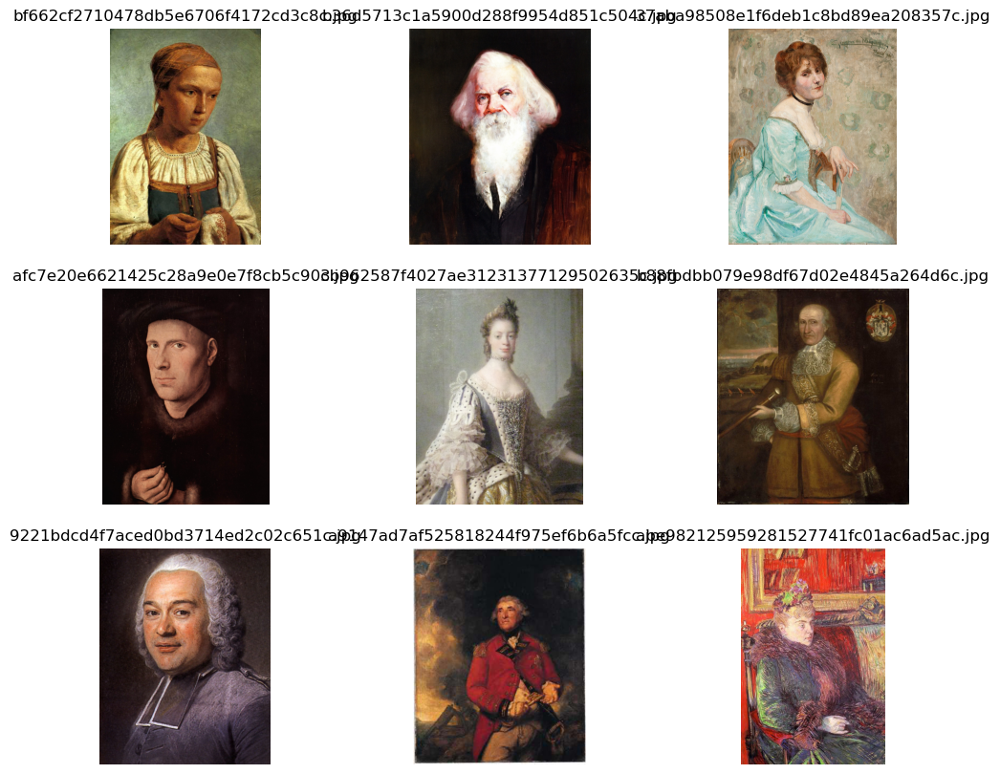

In [4]:
# Plot random images
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10)) # 3x3 grid
for fig, axis in enumerate(axes.flatten()):
    rnd_idx = np.random.randint(0, len(os.listdir(path_img))) # random index
    img = plt.imread(path_img + images[rnd_idx]) # read image
    imgplot = axis.imshow(img) # plot image
    axis.set_title(images[rnd_idx]) # title = image file name
    axis.set_axis_off() # remove axis

## Data (Image) Preprocessing

In [5]:
batch_size = 32 # batch size
img_size = 64 # image size

# image size and shape transformer
random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(img_size),
                               transforms.CenterCrop(img_size),
                               transforms.RandomHorizontalFlip(p=0.5),
                               transforms.RandomApply(random_transforms, p=0.2),
                               transforms.ToTensor(),
                               transforms.Normalize(mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5))
                               ])

# custom dataset (with being resized to 64x64)
train_data = datasets.ImageFolder("./art_portrait", transform=transform)

# data loader
torch.manual_seed(3407) # this is for testing results; encourage to remove this line
np.random.seed(3407) # this is for testing results; encourage to remove this line
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

imgs, label = next(iter(train_loader)) # get a batch of images
imgs = imgs.numpy().transpose(0, 2, 3, 1) # transpose to (batch_size, height, width, channels). Previously, it was (batch_size, channels, height, width)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


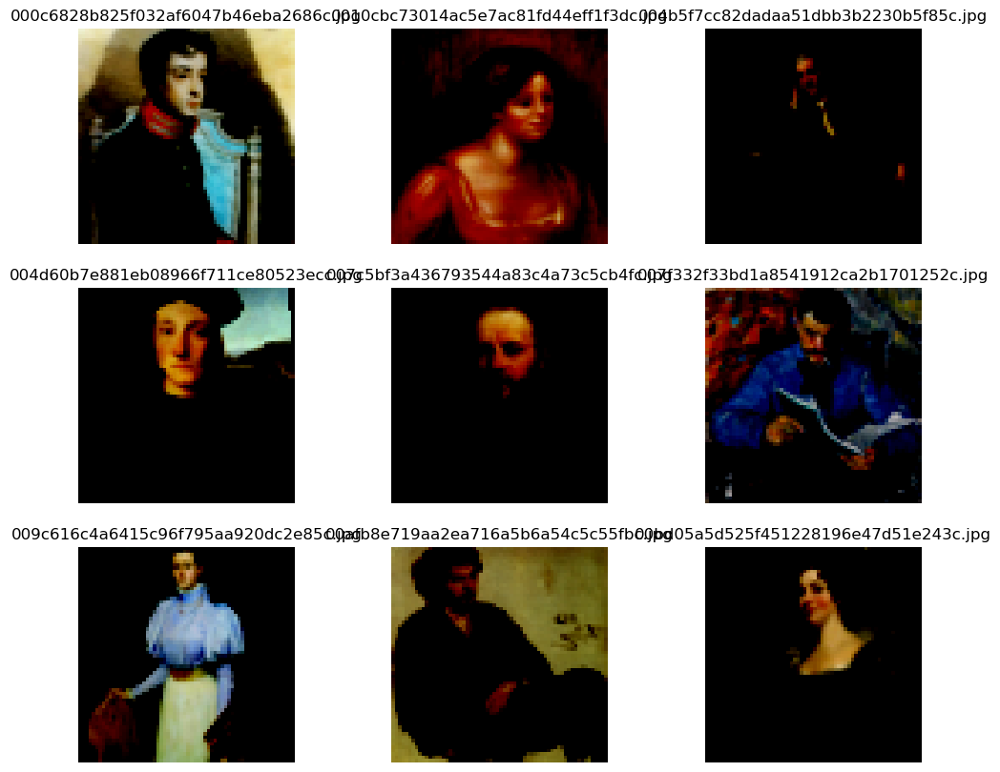

In [6]:
# Plot transformed images
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10)) # 3x3 grid
i = 0
for fig, axis in enumerate(axes.flatten()):
    imgplot = axis.imshow(imgs[i]) # plot image
    axis.set_title(images[i]) # title = image file name
    axis.set_axis_off() # remove axis
    i += 1

## Generator Network

In [7]:
class Generator(nn.Module):
    def __init__(self, nz, ngf, channels):
        super(Generator, self).__init__()

        self.nz = nz # size of the latent z vector
        self.ngf = ngf # number of filters in the generator
        self.channels = channels # number of color channels in the training images

        self.main = nn.Sequential(
                    # 2D transposed convolutional layer (gradient of Conv2d w.r.t input)
                    nn.ConvTranspose2d(in_channels=self.nz, out_channels=self.ngf*8, kernel_size=4, stride=1, padding=0, bias=False),
                    nn.BatchNorm2d(self.ngf*8), # batch normalization layer
                    nn.ReLU(True),

                    nn.ConvTranspose2d(self.ngf*8, self.ngf*4, 4, stride=2, padding=1, bias=False),
                    nn.BatchNorm2d(self.ngf*4),
                    nn.ReLU(True),

                    nn.ConvTranspose2d(self.ngf*4, self.ngf*2, 4, stride=2, padding=1, bias=False),
                    nn.BatchNorm2d(self.ngf*2),
                    nn.ReLU(True),

                    nn.ConvTranspose2d(self.ngf*2, self.ngf, 4, stride=2, padding=1, bias=False),
                    nn.BatchNorm2d(self.ngf),
                    nn.ReLU(True),

                    nn.ConvTranspose2d(self.ngf, self.channels, 4, stride=2, padding=1, bias=False),
                    nn.Tanh()
                    )

    def forward(self, x):
        x = x.view(-1, self.nz, 1, 1) # reshape input
        img = self.main(x) # generate image
        return img


## Discriminator Network

In [8]:
class Discriminator(nn.Module):
    def __init__(self, channels, ndf):
        super(Discriminator, self).__init__()

        self.channels = channels # number of color channels in the training images
        self.ndf = ndf # number of filters in the discriminator

        self.main = nn.Sequential(
                    nn.Conv2d(in_channels=self.channels, out_channels=self.ndf, kernel_size=4, stride=2, padding=1, bias=False),
                    nn.LeakyReLU(negative_slope=0.2, inplace=True),

                    nn.Conv2d(self.ndf, self.ndf*2, 4, stride=2, padding=1, bias=False),
                    nn.BatchNorm2d(self.ndf*2),
                    nn.LeakyReLU(negative_slope=0.2, inplace=True),

                    nn.Conv2d(self.ndf*2, self.ndf*4, 4, stride=2, padding=1, bias=False),
                    nn.BatchNorm2d(self.ndf*4),
                    nn.LeakyReLU(negative_slope=0.2, inplace=True),

                    nn.Conv2d(self.ndf*4, self.ndf*8, 4, stride=2, padding=1, bias=False),
                    nn.BatchNorm2d(self.ndf*8),
                    nn.LeakyReLU(negative_slope=0.2, inplace=True),

                    nn.Conv2d(self.ndf*8, 1, 4, stride=1, padding=0, bias=False),
                    nn.Sigmoid()
                    )
    
    def forward(self, x):
        x = self.main(x)
        x = x.view(-1, 1) # flatten from 2D to 1D b/c the discriminator will output a set of probabilities
        return x


## Weight Initialization

In [9]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0)
    elif classname.find('Linear') != -1:
        torch.nn.init.xavier_normal_(m.weight.data)
        torch.nn.init.constant_(m.bias.data, 0)

## Training

In [10]:
# Hyperparameters

batch_size = 32 # batch size
num_epochs = 50 # number of training epochs
lr_gen = 0.001 # learning rate of the generator
lr_disc = 0.0005 # learning rate of the discriminator

nz = 128 # size of the latent z vector
ngf = 64 # number of filters in the generator
ndf = 64 # number of filters in the discriminator
channels = 3 # number of color channels in the input images

beta1 = 0.5 # beta1 hyperparameter for Adam optimizers

# CPU or GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f' device: {device}')

# generator netowkr
generator = Generator(nz, ngf, channels).to(device)
generator.apply(weights_init)

# discriminator network
discriminator = Discriminator(channels, ndf).to(device)
discriminator.apply(weights_init)

# generator optimizer
optimizer_G = optim.Adam(generator.parameters(), 
                        lr=lr_gen, 
                        betas=(beta1, 0.999))

# discriminator optimizer
optimizer_D = optim.Adam(discriminator.parameters(), 
                        lr=lr_disc, 
                        betas=(beta1, 0.999))

criterion = nn.BCELoss() # binary cross entropy loss


 device: cuda:0


  0%|          | 0/129 [00:00<?, ?it/s]

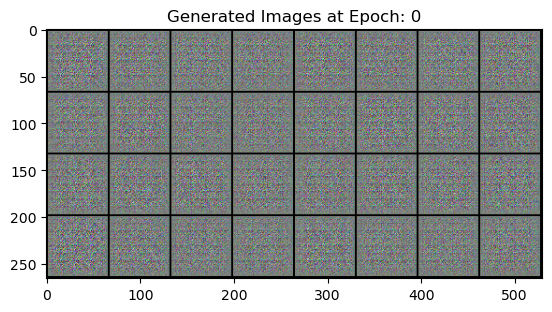

  0%|          | 0/129 [00:00<?, ?it/s]

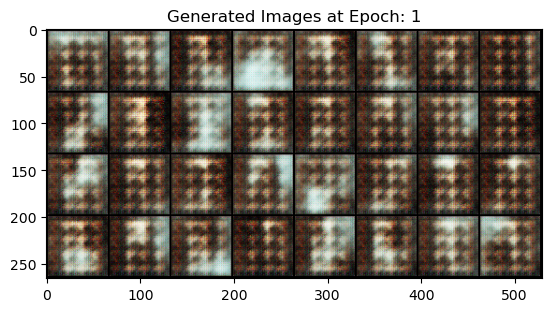

  0%|          | 0/129 [00:00<?, ?it/s]

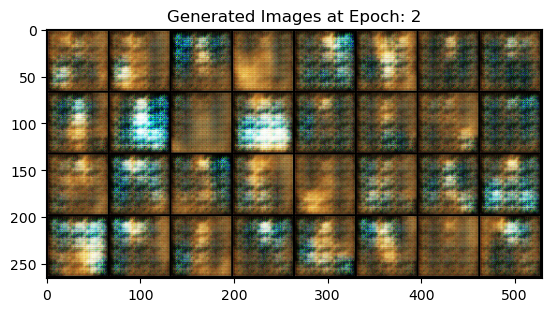

  0%|          | 0/129 [00:00<?, ?it/s]

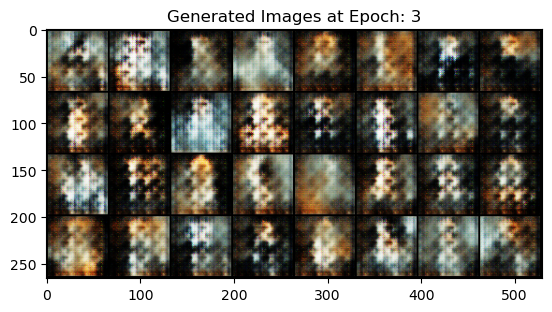

  0%|          | 0/129 [00:00<?, ?it/s]

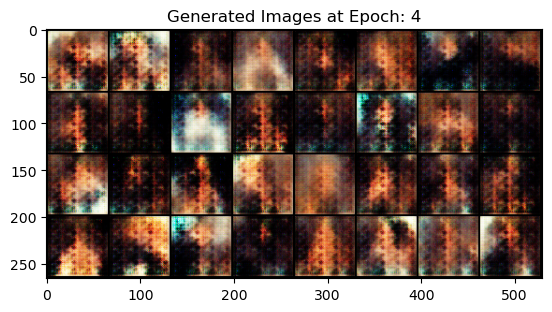

  0%|          | 0/129 [00:00<?, ?it/s]

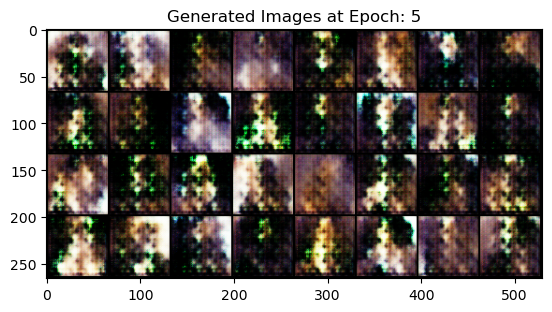

  0%|          | 0/129 [00:00<?, ?it/s]

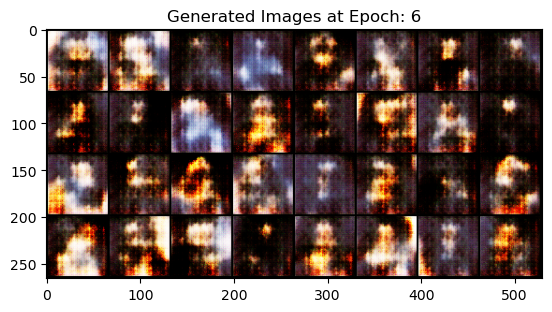

  0%|          | 0/129 [00:00<?, ?it/s]

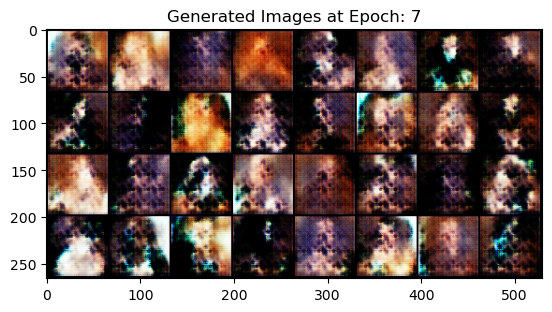

  0%|          | 0/129 [00:00<?, ?it/s]

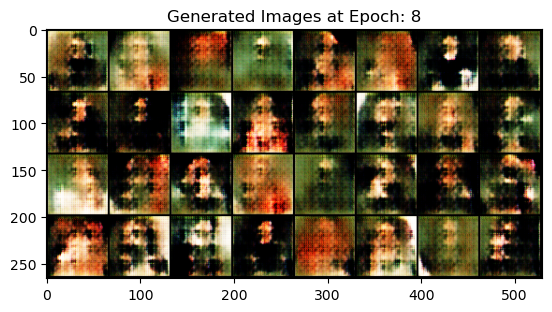

  0%|          | 0/129 [00:00<?, ?it/s]

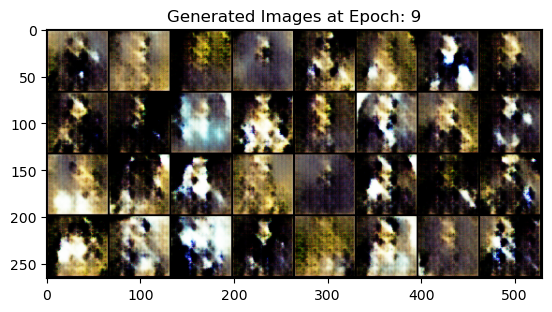

  0%|          | 0/129 [00:00<?, ?it/s]

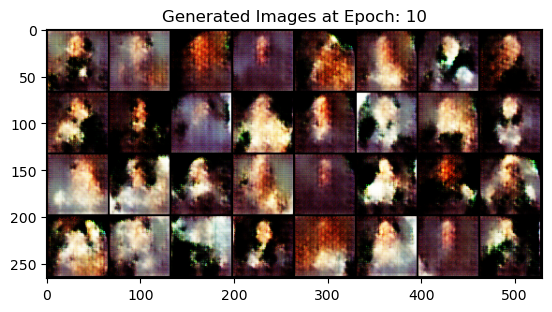

  0%|          | 0/129 [00:00<?, ?it/s]

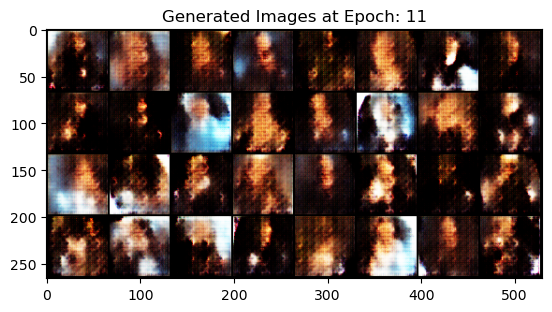

  0%|          | 0/129 [00:00<?, ?it/s]

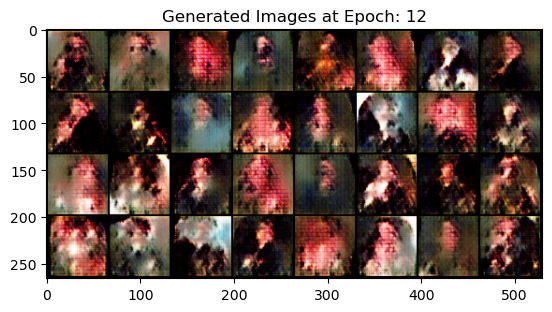

  0%|          | 0/129 [00:00<?, ?it/s]

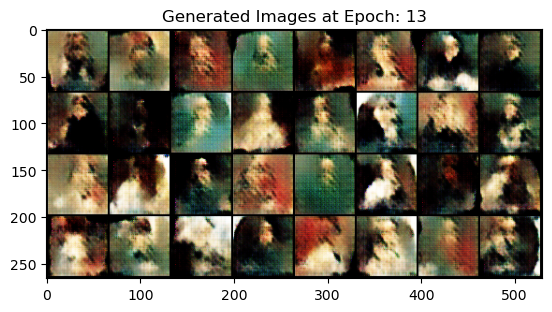

  0%|          | 0/129 [00:00<?, ?it/s]

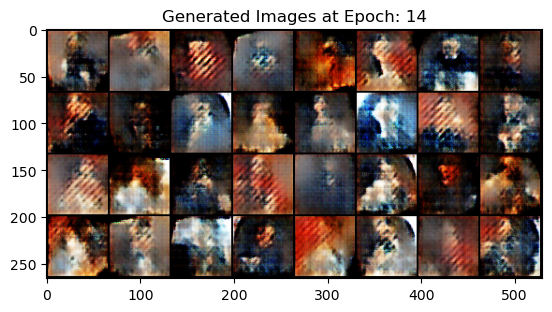

  0%|          | 0/129 [00:00<?, ?it/s]

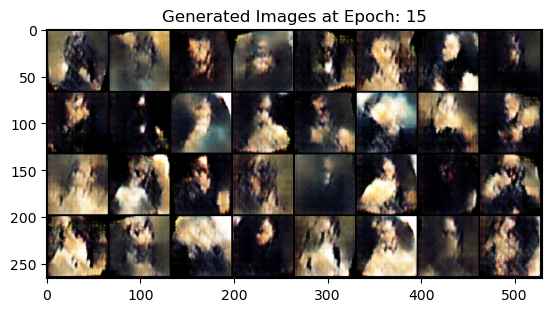

  0%|          | 0/129 [00:00<?, ?it/s]

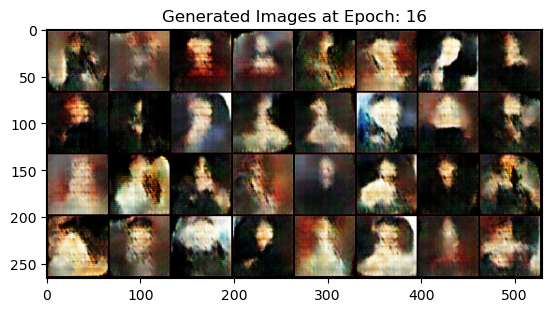

  0%|          | 0/129 [00:00<?, ?it/s]

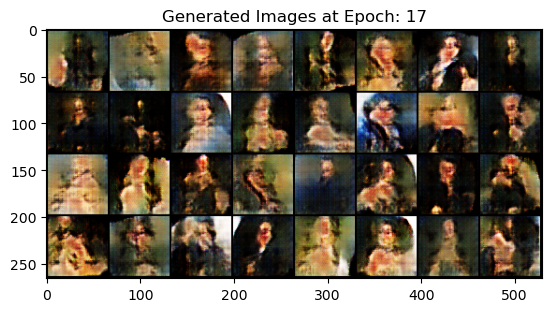

  0%|          | 0/129 [00:00<?, ?it/s]

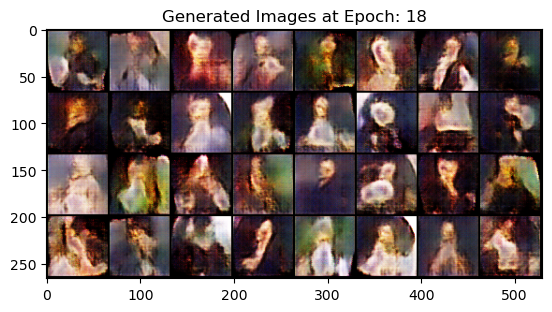

  0%|          | 0/129 [00:00<?, ?it/s]

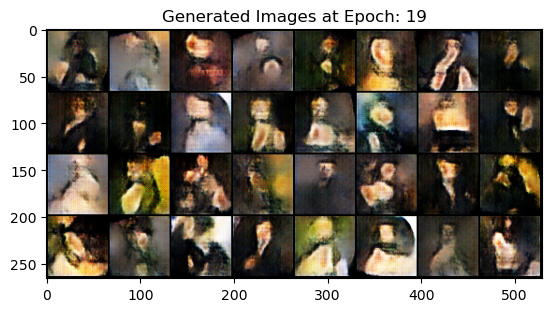

  0%|          | 0/129 [00:00<?, ?it/s]

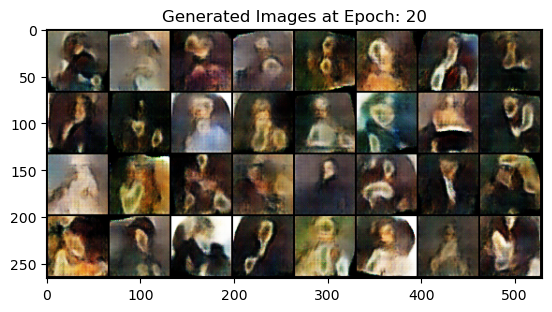

  0%|          | 0/129 [00:00<?, ?it/s]

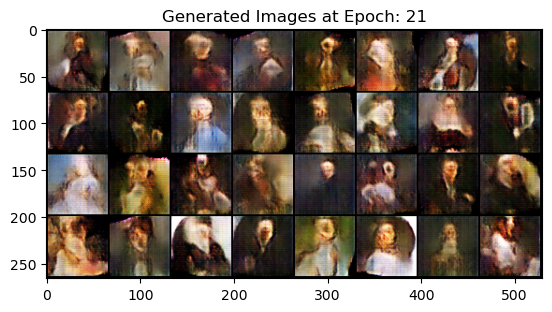

  0%|          | 0/129 [00:00<?, ?it/s]

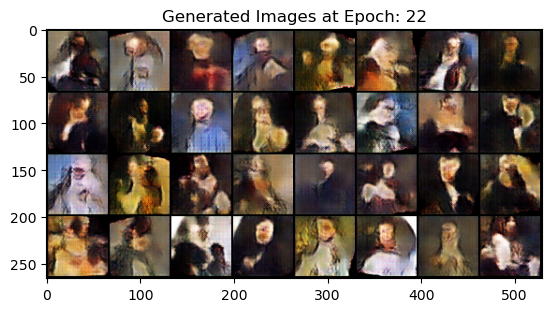

  0%|          | 0/129 [00:00<?, ?it/s]

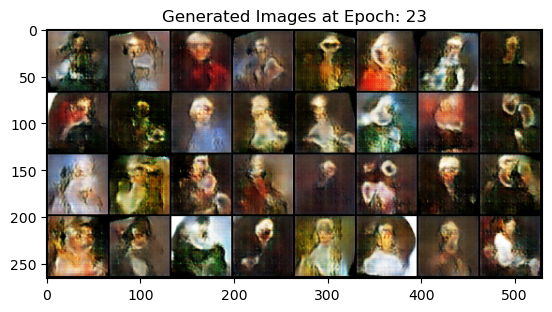

  0%|          | 0/129 [00:00<?, ?it/s]

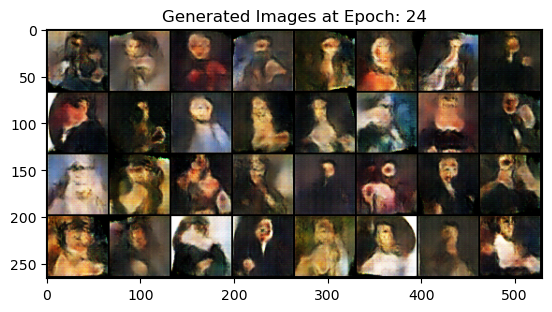

  0%|          | 0/129 [00:00<?, ?it/s]

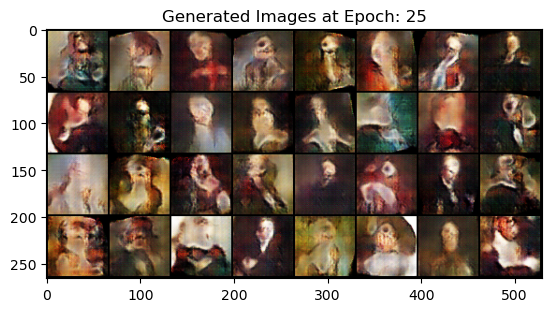

  0%|          | 0/129 [00:00<?, ?it/s]

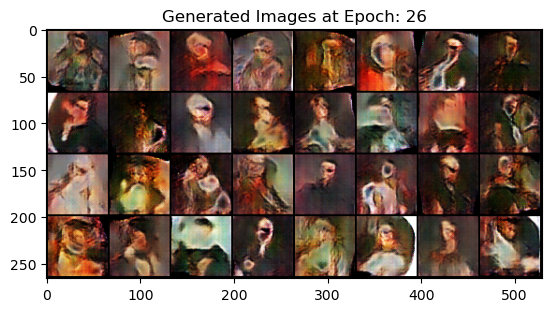

  0%|          | 0/129 [00:00<?, ?it/s]

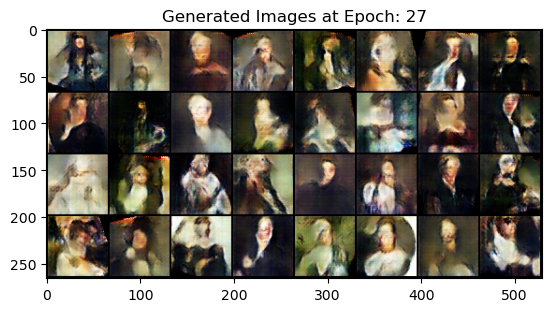

  0%|          | 0/129 [00:00<?, ?it/s]

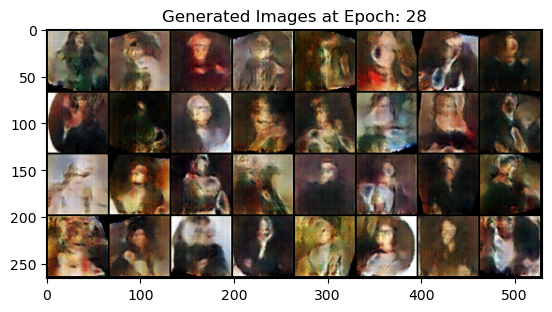

  0%|          | 0/129 [00:00<?, ?it/s]

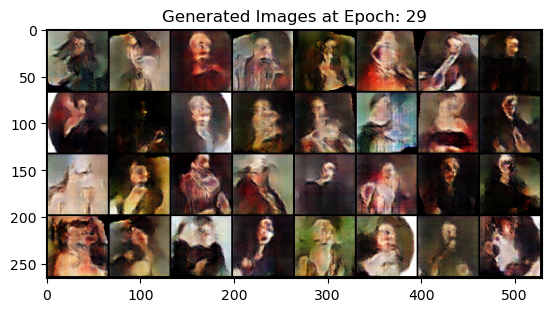

  0%|          | 0/129 [00:00<?, ?it/s]

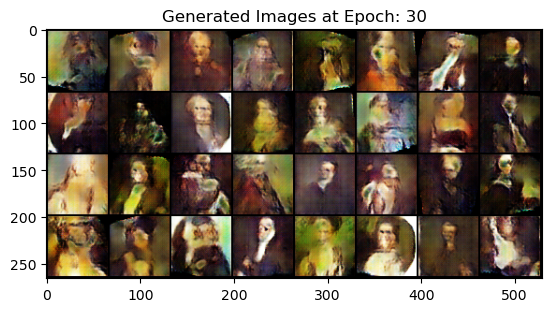

  0%|          | 0/129 [00:00<?, ?it/s]

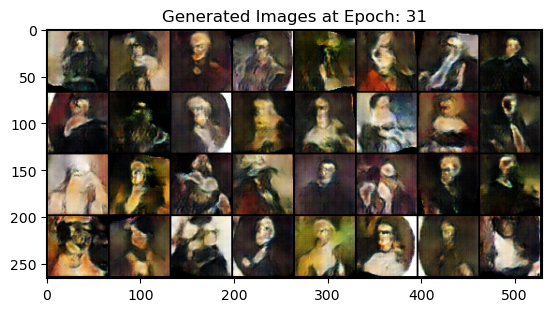

  0%|          | 0/129 [00:00<?, ?it/s]

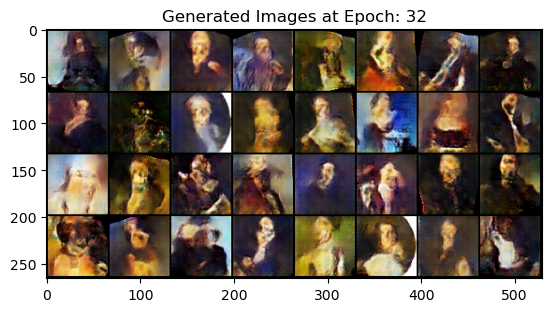

  0%|          | 0/129 [00:00<?, ?it/s]

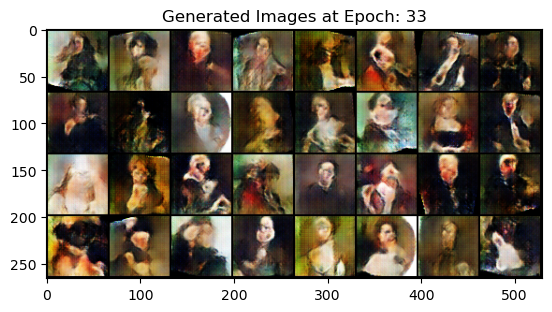

  0%|          | 0/129 [00:00<?, ?it/s]

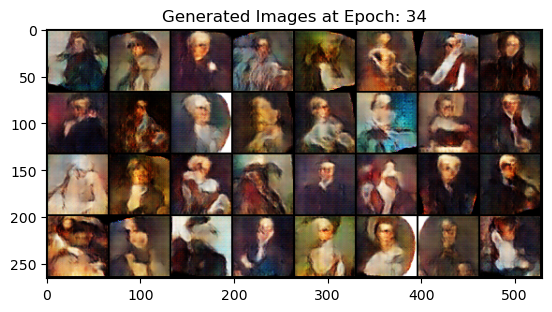

  0%|          | 0/129 [00:00<?, ?it/s]

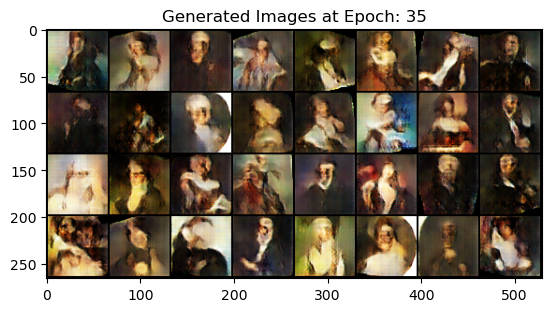

  0%|          | 0/129 [00:00<?, ?it/s]

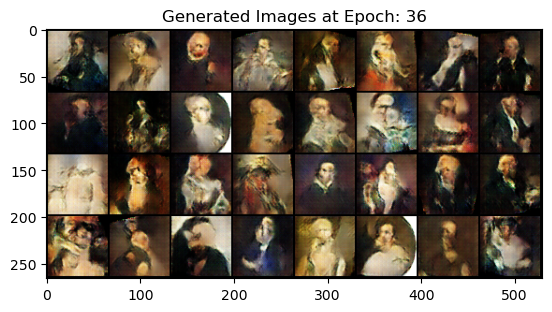

  0%|          | 0/129 [00:00<?, ?it/s]

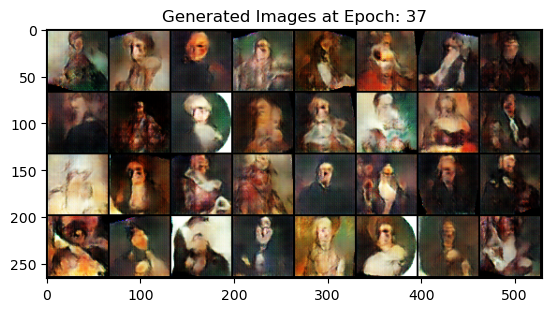

  0%|          | 0/129 [00:00<?, ?it/s]

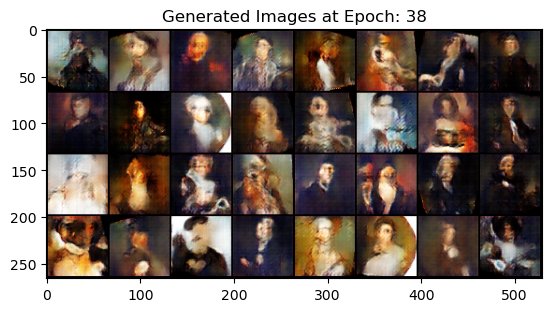

  0%|          | 0/129 [00:00<?, ?it/s]

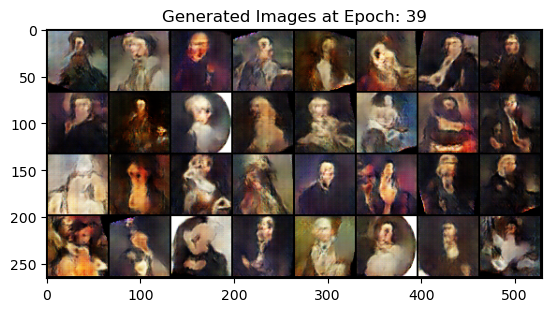

  0%|          | 0/129 [00:00<?, ?it/s]

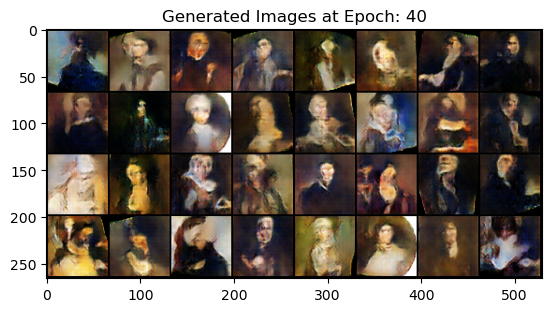

  0%|          | 0/129 [00:00<?, ?it/s]

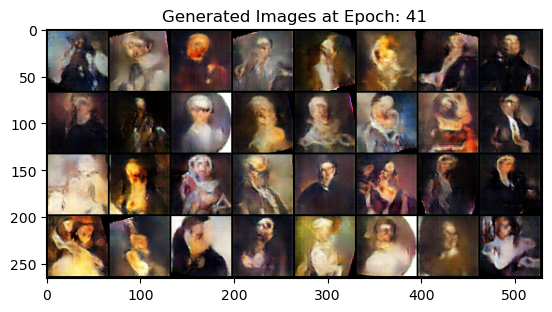

  0%|          | 0/129 [00:00<?, ?it/s]

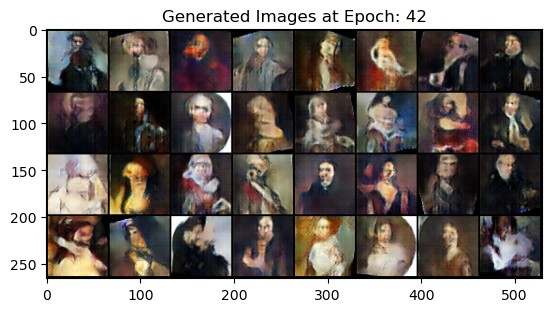

  0%|          | 0/129 [00:00<?, ?it/s]

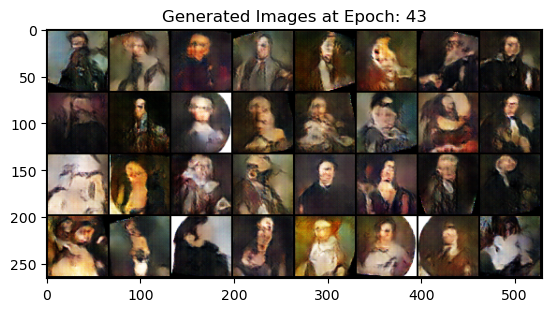

  0%|          | 0/129 [00:00<?, ?it/s]

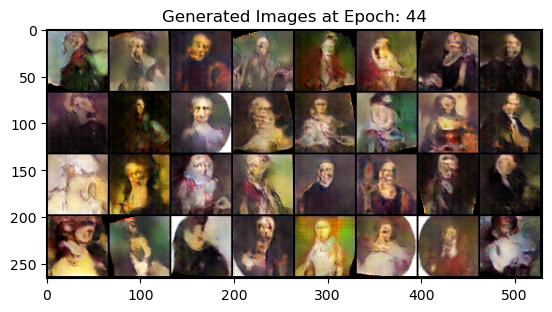

  0%|          | 0/129 [00:00<?, ?it/s]

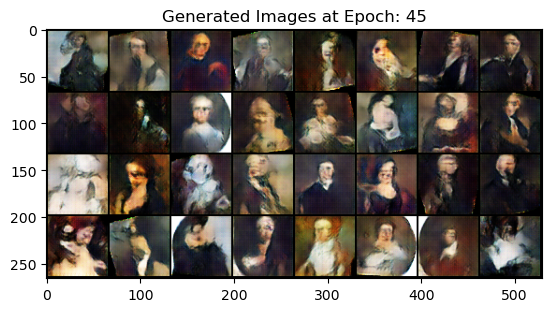

  0%|          | 0/129 [00:00<?, ?it/s]

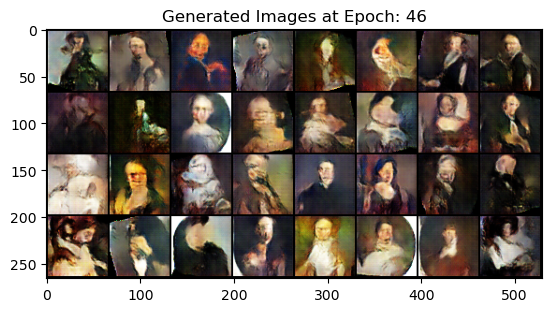

  0%|          | 0/129 [00:00<?, ?it/s]

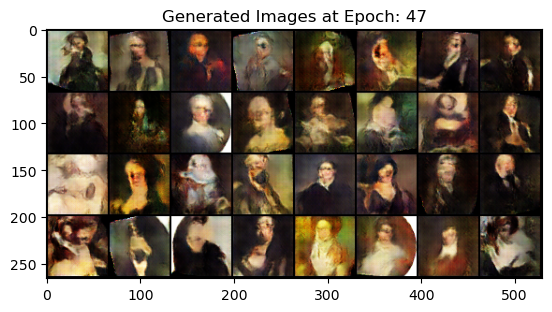

  0%|          | 0/129 [00:00<?, ?it/s]

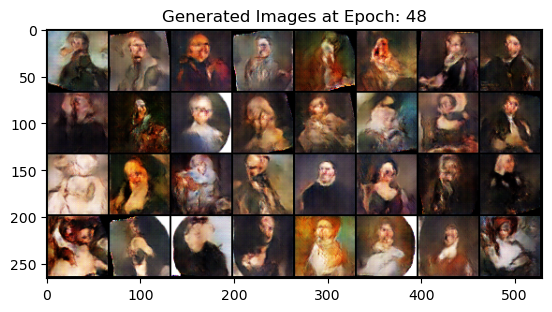

  0%|          | 0/129 [00:00<?, ?it/s]

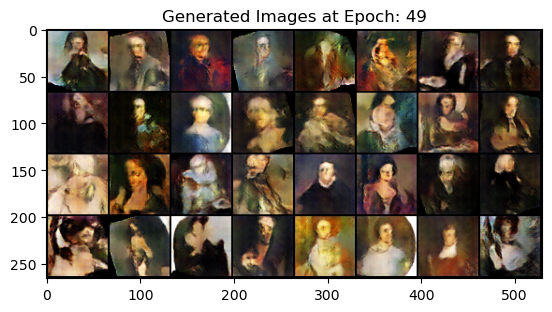

100%|██████████| 129/129 [02:50<00:00,  1.32s/it]
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning

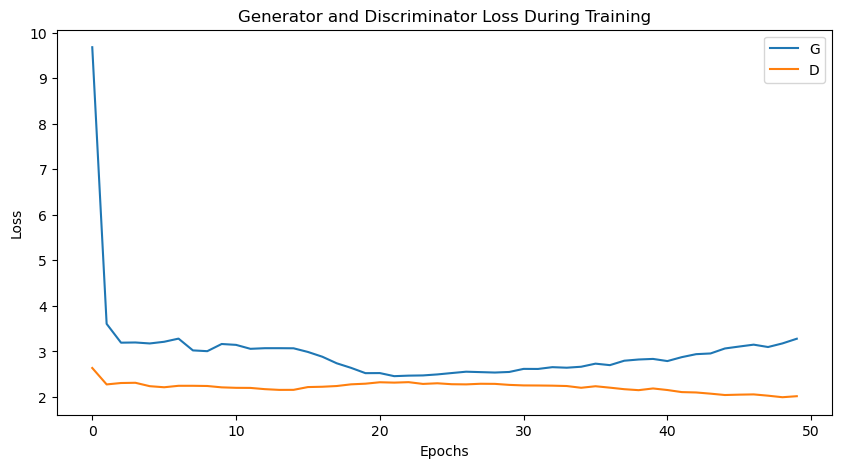

In [11]:
# Training
torch.manual_seed(3407) # this is for testing results; encourage to remove this line
np.random.seed(3407) # this is for testing results; encourage to remove this line

real_label = 1
fake_label = 0
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device) # fixed noise for testing
loss_G_epoch = 0
loss_D_epoch = 0
loss_IR_epoch = 0
loss_G_epoch_list = []
loss_D_epoch_list = []
generated_batch_imgs = [] # list to keep track of the generated images

for epoch in range(num_epochs):

    for i, (real_images, _) in tqdm(enumerate(train_loader), total=len(train_loader)):

        batch_size = real_images.size(0) # batch size
        
        real_images = real_images.to(device) # real images from training set
        
        noise = torch.randn(batch_size, nz, 1, 1, device=device) # random noise
        fake_images = generator(noise) # fake images generated from random noise

        ############################ Train the discriminator ############################

        # Train the discriminator with real images
        discriminator.zero_grad()
        label = torch.full((batch_size, 1), real_label, device=device, dtype=torch.float)
        output = discriminator(real_images) # probability of the image being real
        loss_D_real = criterion(output, label) # discriminator loss on real images
        loss_D_real.backward() # backpropagation

        # Train the discriminator with fake images
        label.fill_(fake_label)
        output = discriminator(fake_images.detach()) # probability of the image being fake
        loss_D_fake = criterion(output, label) # discriminator loss on fake images
        loss_D_fake.backward() # backpropagation

        # Update discriminator parameters
        loss_D = loss_D_real + loss_D_fake # total discriminator loss
        optimizer_D.step() # update the discriminator parameters

        ############################ Train the generator ############################

        # Train the generator
        generator.zero_grad()
        label.fill_(real_label) # pretend that the fake images are real
        output = discriminator(fake_images)
        loss_G = criterion(output, label) # generator loss
        loss_G.backward() # backpropagation
        optimizer_G.step() # update the generator parameters

        ###############################################################################
        loss_G_epoch += loss_G.item()
        loss_D_epoch += loss_D.item()
        
        # Display images generated from fixed noise & trained generator every 10 epochs
        if epoch % 1 == 0 and i == 0:
            with torch.no_grad():
                fake = generator(fixed_noise).detach().cpu()
            img_grid = vutils.make_grid(fake, padding=2, normalize=True) # a grid of images
            img_grid = np.transpose(img_grid, (1, 2, 0))
            plt.title(f'Generated Images at Epoch: {epoch}')
            plt.imshow(img_grid)
            plt.show()
            
            generated_batch_imgs.append(img_grid) # append the generated batch of images to the list

    loss_G_epoch_avg = loss_G_epoch / i+1
    loss_D_epoch_avg = loss_D_epoch / i+1
    loss_G_epoch_list.append(loss_G_epoch_avg)
    loss_D_epoch_list.append(loss_D_epoch_avg)

    loss_G_epoch = 0
    loss_D_epoch = 0
    loss_IR_epoch = 0

# Plot the losses
plt.figure(figsize=(10, 5))
plt.title('Generator and Discriminator Loss During Training')
plt.plot(loss_G_epoch_list, label='G')
plt.plot(loss_D_epoch_list, label='D')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Generate a GIF of the images generated by the generator
imageio.mimsave('generated_images_no_intrinsic_reward.gif', generated_batch_imgs, fps=4)
   